In [1]:
import pandas as pd
import numpy  as np
import matplotlib.pyplot as plt
import seaborn 
import tensorflow as tf
import tensorflow_data_validation as tfdv
from sklearn.neighbors import NearestNeighbors
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GroupKFold
import gc
from tqdm import tqdm 

def get_id2poi(input_df: pd.DataFrame) -> dict:
    return dict(zip(input_df['id'], input_df['point_of_interest']))

def get_poi2ids(input_df: pd.DataFrame) -> dict:
    return input_df.groupby('point_of_interest')['id'].apply(set).to_dict()

def get_score(input_df: pd.DataFrame):
    scores = []
    for id_str, matches in zip(input_df['id'].to_numpy(), input_df['matches'].to_numpy()):
        targets = poi2ids[id2poi[id_str]]
        preds = set(matches.split())
        score = len((targets & preds)) / len((targets | preds))
        scores.append(score)
    scores = np.array(scores)
    return scores.mean()

def reduce_memory(df):
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type != object:
            cmin = df[col].min()
            cmax = df[col].max()
            if str(col_type)[:3] == 'int':
                if cmin > np.iinfo(np.int8).min and cmax < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif cmin > np.iinfo(np.int16).min and cmax < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif cmin > np.iinfo(np.int32).min and cmax < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif cmin > np.iinfo(np.int64).min and cmax < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if cmin > np.finfo(np.float16).min and cmax < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif cmin > np.finfo(np.float32).min and cmax < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    return df

# EDA

In [2]:
print('TF version:', tf.__version__)

TF version: 2.9.1


In [3]:
ss = pd.read_csv('sample_submission.csv')
ss.head()

,id,matches
0,E_00001118ad0191,E_00001118ad0191
1,E_000020eb6fed40,E_000020eb6fed40
2,E_00002f98667edf,E_00002f98667edf
3,E_001b6bad66eb98,E_001b6bad66eb98 E_0283d9f61e569d
4,E_0283d9f61e569d,E_0283d9f61e569d E_001b6bad66eb98


In [4]:
serving = pd.read_csv('test.csv')
serving.head()

,id,name,latitude,longitude,address,city,state,zip,country,url,phone,categories
0,E_00001118ad0191,Jamu Petani Bagan Serai,5.012169,100.535805,NaN,NaN,NaN,NaN,MY,NaN,NaN,Cafés
1,E_000020eb6fed40,Johnny's Bar,40.434209,-80.564160,497 N 12th St,Weirton,WV,26062.0,US,NaN,NaN,Bars
2,E_00002f98667edf,QIWI,47.215134,39.686088,"Межевая улица, 60",Ростов-на-Дону,NaN,NaN,RU,https://qiwi.com,7.800301e+10,ATMs
3,E_001b6bad66eb98,"Gelora Sriwijaya, Jaka Baring Sport City",-3.014675,104.794374,NaN,NaN,NaN,NaN,ID,NaN,NaN,Stadiums
4,E_0283d9f61e569d,Stadion Gelora Sriwijaya,-3.021727,104.788628,Jalan Gubernur Hasan Bastari,Palembang,South Sumatra,11480.0,ID,NaN,NaN,Soccer Stadiums


In [33]:
serving.shape

(5, 12)

In [3]:
pairs = pd.read_csv('pairs.csv')
pairs = reduce_memory(pairs)
print(pairs.shape)
print(pairs.columns)
pairs.head()

(578907, 25)
Index(['id_1', 'name_1', 'latitude_1', 'longitude_1', 'address_1', 'city_1',
       'state_1', 'zip_1', 'country_1', 'url_1', 'phone_1', 'categories_1',
       'id_2', 'name_2', 'latitude_2', 'longitude_2', 'address_2', 'city_2',
       'state_2', 'zip_2', 'country_2', 'url_2', 'phone_2', 'categories_2',
       'match'],
      dtype='object')


,id_1,name_1,latitude_1,longitude_1,address_1,city_1,state_1,zip_1,country_1,url_1,...,longitude_2,address_2,city_2,state_2,zip_2,country_2,url_2,phone_2,categories_2,match
0,E_000001272c6c5d,Café Stad Oudenaarde,50.875000,3.634766,Abdijstraat,Nederename,Oost-Vlaanderen,9700,BE,NaN,...,3.634766,NaN,NaN,NaN,NaN,BE,NaN,NaN,Bars,1.0
1,E_000008a8ba4f48,Turkcell,37.843750,27.843750,Adnan Menderes Bulvarı,NaN,NaN,NaN,TR,NaN,...,27.843750,batı aydın,aydın,NaN,67500,TR,NaN,NaN,Electronics Stores,0.0
2,E_000023d8f4be44,Island Spa,14.515625,121.000000,"5th Flr, Newport Mall, Resorts World Manila",Pasay City,Metro Manila,NaN,PH,NaN,...,121.000000,NaN,NaN,NaN,NaN,PH,NaN,NaN,Spas,1.0
3,E_00007dcd2bb53f,TOGO'S Sandwiches,38.250000,-122.062500,"1380 Holiday Ln., Ste. B",Fairfield,CA,94534,US,https://locations.togos.com/ll/US/CA/Fairfield...,...,-122.062500,NaN,Fairfield,CA,NaN,US,NaN,NaN,Sandwich Places,1.0
4,E_0000c362229d93,Coffee Cat,7.082031,125.625000,F. Torres St.,Davao City,Davao Region,8000,PH,NaN,...,125.625000,E. Jacinto Extension,Davao City,Davao Region,8000,PH,NaN,NaN,"Coffee Shops, Cafés, Dessert Shops",0.0


In [ ]:
pair_stats = tfdv.generate_statistics_from_dataframe(pairs)
tfdv.visualize_statistics(pair_stats)

In [4]:
df = pd.read_csv('train.csv')
df = reduce_memory(df)
print(df.shape)
df.head()

(1138812, 13)


,id,name,latitude,longitude,address,city,state,zip,country,url,phone,categories,point_of_interest
0,E_000001272c6c5d,Café Stad Oudenaarde,50.87500,3.634766,Abdijstraat,Nederename,Oost-Vlaanderen,9700,BE,NaN,NaN,Bars,P_677e840bb6fc7e
1,E_000002eae2a589,Carioca Manero,-22.90625,-43.187500,NaN,NaN,NaN,NaN,BR,NaN,NaN,Brazilian Restaurants,P_d82910d8382a83
2,E_000007f24ebc95,ร้านตัดผมการาเกด,13.78125,100.500000,NaN,NaN,NaN,NaN,TH,NaN,NaN,Salons / Barbershops,P_b1066599e78477
3,E_000008a8ba4f48,Turkcell,37.84375,27.843750,Adnan Menderes Bulvarı,NaN,NaN,NaN,TR,NaN,NaN,Mobile Phone Shops,P_b2ed86905a4cd3
4,E_00001d92066153,Restaurante Casa Cofiño,43.34375,-4.328125,NaN,Caviedes,Cantabria,NaN,ES,NaN,NaN,Spanish Restaurants,P_809a884d4407fb


In [9]:
train_stats = tfdv.generate_statistics_from_dataframe(df)
tfdv.visualize_statistics(train_stats)

In [10]:
schema = tfdv.infer_schema(train_stats)
tfdv.display_schema(schema)

,Type,Presence,Valency,Domain
Feature name,,,,
'id',BYTES,required,,-
'name',BYTES,optional,single,-
'latitude',FLOAT,required,,-
'longitude',FLOAT,required,,-
'address',BYTES,optional,single,-
'city',BYTES,optional,single,-
'state',BYTES,optional,single,-
'zip',BYTES,optional,single,-
'country',BYTES,optional,single,-


C:\Users\abhin\anaconda3\envs\tf\lib\site-packages\matplotlib_venn\_venn3.py:117: UserWarning: Bad circle positioning
  warnings.warn("Bad circle positioning")


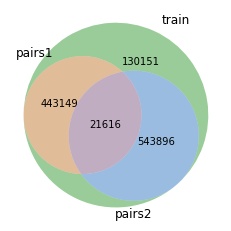

In [11]:
from matplotlib_venn import venn3
from matplotlib_venn import venn2
venn3([set(pairs['id_1'].values.astype('str')),set(df['id'].values.astype('str')),set(pairs['id_2'].values.astype('str'))],('pairs1','train','pairs2'))
plt.show()

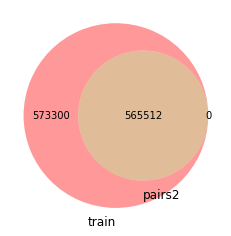

In [12]:
venn2([set(df['id'].values.astype('str')),set(pairs['id_2'].values.astype('str'))],('train','pairs2'))
plt.show()

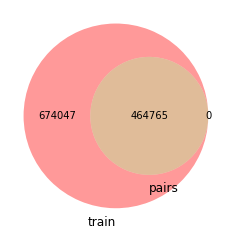

In [13]:
venn2([set(df['id'].values.astype('str')),set(pairs['id_1'].values.astype('str'))],('train','pairs'))
plt.show()

In [14]:
set_of_no_match_ids  = set(df['id'].values.astype('str')) - set(pairs['id_1'].values.astype('str')).union(list(set(pairs['id_2'].values.astype('str'))))
len(set_of_no_match_ids)

130151

# DATA prep and modeling 

In [5]:
match_df = pd.merge(df, df, on="point_of_interest", suffixes=('_1', '_2'))
match_df = match_df[match_df["id_1"]!=match_df["id_2"]]
match_df = match_df.drop(["point_of_interest"], axis=1)
match_df["match"] = True
print(match_df.shape)
match_df.fillna("NA",inplace = True)
match_df.head()

(1901006, 25)


,id_1,name_1,latitude_1,longitude_1,address_1,city_1,state_1,zip_1,country_1,url_1,...,longitude_2,address_2,city_2,state_2,zip_2,country_2,url_2,phone_2,categories_2,match
1,E_000001272c6c5d,Café Stad Oudenaarde,50.87500,3.634766,Abdijstraat,Nederename,Oost-Vlaanderen,9700,BE,NA,...,3.634766,NA,NA,NA,NA,BE,NA,NA,Bars,True
2,E_da7fa3963561f8,Café Oudenaarde,50.87500,3.634766,NA,NA,NA,NA,BE,NA,...,3.634766,Abdijstraat,Nederename,Oost-Vlaanderen,9700,BE,NA,NA,Bars,True
5,E_000002eae2a589,Carioca Manero,-22.90625,-43.187500,NA,NA,NA,NA,BR,NA,...,-43.187500,Shopping Avenida Central,Rio de Janeiro,RJ,20040-901,BR,NA,NA,"Bars, Snack Places",True
6,E_e80db432029aea,Carioca Manero,-22.90625,-43.187500,Shopping Avenida Central,Rio de Janeiro,RJ,20040-901,BR,NA,...,-43.187500,NA,NA,NA,NA,BR,NA,NA,Brazilian Restaurants,True
11,E_00001d92066153,Restaurante Casa Cofiño,43.34375,-4.328125,NA,Caviedes,Cantabria,NA,ES,NA,...,-4.328125,Barrio de los Caviedes s/n,Valdáliga / Cantabria,Spain,39593,ES,NA,34942708046,Spanish Restaurants,True


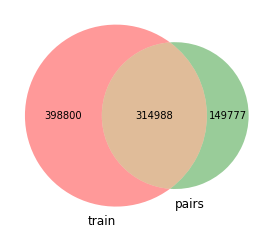

In [6]:
from matplotlib_venn import venn2
venn2([set(match_df['id_1'].values.astype('str')),set(pairs['id_1'].values.astype('str'))],('train','pairs'))
plt.show()

In [7]:
grouped_df = match_df.groupby('id_1')

In [8]:
dict_df = dict(list(grouped_df))

In [9]:
set_keys = set(match_df['id_1'].values)
keys = list(set(match_df['id_1'].values))

In [94]:
dict_non_match = {}
def non_match(keys) :
#     global counter
#     print(counter)
    temp  = set_keys.copy()
    temp2 = dict_df[keys]['id_1'].iloc[0]
    temp_nm = temp - set(dict_df[keys]['id_2'].values)
    dict_non_match[temp2] = random.sample(list(temp_nm),40)
    #counter+=1
    #return dict_non_match

In [95]:
len(keys)

713788

In [96]:
import random 
random_keys = random.sample(keys,10000)
random_keys[1]

'E_4100f81bfbdbdc'

In [97]:
temp = list(map(non_match, random_keys)) # random_keys

In [98]:
ind = list(df['id'].values)
def id_to_idx(id, ind = ind):
    return ind.index(id)
     

In [99]:
from multiprocessing.dummy import Pool as ThreadPool 
def create_non_match_tuples(i, keys, values):
    list_non_match = []

    values  = random.sample(values,40)
    row_1 = df.iloc[id_to_idx(keys)]
    for x in tqdm(values):
        row_2 = df.iloc[id_to_idx(x)]
        pair = (row_1,row_2)
        list_non_match.append(pair)
    return i,list_non_match
pool = ThreadPool(8)
%timeit
results = pool.starmap(create_non_match_tuples, zip(range(len(dict_non_match)),list(dict_non_match.keys()),list(dict_non_match.values()))) 
pool.close() 
pool.join()


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 115.02it/s]





 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 153.39it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 116.07it/s]


 25%|████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.47it/s]






 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 118.11it/s]



 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 109.96it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 15.44it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.36it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 12.70it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.95it/s]



  0%|       

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 69.97it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 147.46it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.28it/s]





 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 139.40it/s]

  0%|            

 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 79.81it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.99it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 55.37it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 42%|██████████████████████████████████▊                                               | 17/40 [00:00<00:00, 37.42it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 42.58it/s]




 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 172.76it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.81it/s]


 38%|████████████████

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 137.55it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.06it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 60.20it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.39it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:00<00:00, 49.26it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 39.65it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 38%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.33it/s]


 50%|████████████████████████████████████████▌                                        | 20/40 [00:00<00:00, 183.70it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 47.07it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 139.38it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 108.37it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 40.28it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 45.25it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 36.38it/s]




 57%|███████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:06<00:00,  4.86it/s]

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 89.13it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:06<00:00,  6.01it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 131.87it/s]





 25%|██████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.92it/s]

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 93.75it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.67it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.80it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 49.47it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 40.41it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 42%|███████████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 48.85it/s]




 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 66.14it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 128.18it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 49.18it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 135.49it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 68%|█████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.26it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.34it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 61.05it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:05<00:00,  4.42it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.94it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 104.93it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:06<00:00,  4.39it/s]




100%|██████████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.91it/s]






 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.48it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.08it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.03it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 125.69it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 157.32it/s]

 95%|████████████████

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 24.19it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 48.69it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 13.79it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 86.62it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 16.75it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 33.16it/s]

 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 42.40it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 98%|████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 39.19it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 117.44it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 117.69it/s]

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 26.65it/s]




 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 143.42it/s]





 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 86.82it/s]



 68%|███████

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 50.02it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 23.00it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 123.67it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 118.91it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 124.21it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 15.02it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 43.57it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.96it/s]






100%|██████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.97it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 15.93it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 109.31it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 38.68it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.93it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.37it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 71.19it/s]

100%|█████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 106.37it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 136.62it/s]


 50%|████████████████████████████████████████▌                                        | 20/40 [00:00<00:00, 168.37it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.75it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 62.61it/s]


 92%|███████████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.60it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 26.63it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 37.44it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.91it/s]







 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 39.66it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 15.19it/s]






 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 119.46it/s]


100%|████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 49.99it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.96it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.88it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 26.48it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 38.21it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 22.56it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 23.14it/s]




 85%|████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 28.23it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 80.11it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.59it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 57.07it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.76it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.47it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.56it/s]




100%|████████████

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 106.55it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 25.24it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 121.60it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 26.22it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 18.33it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 40.00it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 18.73it/s]




 68%|████████

 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 140.10it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 30.35it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 74.17it/s]

 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 154.53it/s]





 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 106.30it/s]



 98%|███████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.11it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.76it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.73it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.55it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 71.53it/s]



 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 64.25it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 42%|████████████████████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 125.01it/s]

 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 33.63it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 36.25it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 43.55it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 24.78it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 43.24it/s]






  0%|          

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]







 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 121.21it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.23it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 39.51it/s]






 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 59.11it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 21.50it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 55.88it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 128.36it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 40.78it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 36.04it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 19.13it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.63it/s]






 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 45.12it/s]






 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 40.02it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 29.83it/s]




 85%|██████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 28.54it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.90it/s]






 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 38.40it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 14.91it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 22.62it/s]






 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 64.57it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 20.08it/s]





100%|

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.75it/s]






 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 154.82it/s]




 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 47.74it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.42it/s]






 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 122.13it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 12.81it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 54.01it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.35it/s]







 65%|

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.52it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 124.08it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 41.20it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 99.71it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:23<00:00,  4.15it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:23<00:00,  4.14it/s]




  0%|               

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 68.11it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 36.12it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 27.76it/s]




 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 89.06it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 121.09it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 29.56it/s]


 95%|███████████

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 133.08it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 123.26it/s]


 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 152.89it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 36.92it/s]

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 36.63it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.93it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 26.54it/s]

 85%|█████████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 70.10it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 89.78it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 29.98it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 123.68it/s]



 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 28.07it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.18it/s]





 40%|██████

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 21.04it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 22.76it/s]






 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 15.56it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.10it/s]







100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.13it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.82it/s]


 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 108.37it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 34.98it/s]


  0%|   

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 47.12it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 36.36it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 39.26it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 52%|██████████████████████████████████████████▌                                      | 21/40 [00:00<00:00, 182.32it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 28.69it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|         

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 121.31it/s]





 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 128.80it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 10.92it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 31.28it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 49.96it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.01it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 109.84it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 27.05it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.18it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.01it/s]


 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 171.67it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 35.26it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 79.47it/s]


 85%|██████████████

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 20.63it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 37.15it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.14it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 80.05it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 51.26it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 110.60it/s]

 50%|██████████████████████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 27.57it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 42.03it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 125.89it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 23.77it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 36.56it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.76it/s]


 68%|███████







 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 44.24it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.72it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 36.40it/s]

 48%|██████████████████████████████████████▍                                          | 19/40 [00:00<00:00, 166.04it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.47it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 90%|█████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 88.38it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 133.31it/s]



 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 43.96it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 57.08it/s]



 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 33.07it/s]

 20%|████████████████▌                                                                  | 8/40 [00:00<00:00, 76.95it/s]




 75%|████████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 28.11it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.64it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 26.64it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 22.30it/s]

 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 168.48it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 133.26it/s]





  0%|                

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 37.48it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 101.26it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 138.73it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.75it/s]




 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 97.69it/s]





 55%|████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.06it/s]




 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 161.32it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 14.26it/s]




 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 141.32it/s]


 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 27.33it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 58.17it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 51.33it/s]


100%|██████████

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 21.28it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 35.36it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.45it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 139.17it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 20.65it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 68.65it/s]


100%|██████████████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 41.57it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 62.68it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 139.74it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 22.37it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 24.29it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 48.66it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 17.98it/s]

 95%|██████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 104.77it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.96it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 31.78it/s]


 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 65.57it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 42.30it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 53.01it/s]



100%|████████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 119.82it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 18.61it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 45.64it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 13.50it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 114.87it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 36.20it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.13it/s]


 92%|█████████████

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 139.17it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.13it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.26it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 128.56it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 46.98it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.04it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.39it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 50.55it/s]




 90%|███████

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 28.36it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 26.42it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 31.66it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 25.69it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 24.39it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 92.90it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 24.29it/s]



100%|████████

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 45.73it/s]





 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 108.29it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 37.15it/s]


 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 97.97it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 29.07it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 31.87it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 27.06it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 52%|█████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 28.45it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 26.31it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.70it/s]






 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 40.53it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 29.70it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.33it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.32it/s]






100%|███

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 49.97it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 23.45it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.34it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.74it/s]







 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 101.86it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 30.86it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.43it/s]







100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.59it/s]





100%

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.98it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.81it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 13.73it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:02<00:00, 13.39it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.36it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 11.92it/s]



 28%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.38it/s]


 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 73.66it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 29.15it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 49.44it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:00<00:00, 41.99it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 98%|███████████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 12.59it/s]


 20%|████████████████▌                                                                  | 8/40 [00:00<00:00, 77.62it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 20.72it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 123.42it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00,  9.30it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.91it/s]







 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 140.52it/s]



 98%|███

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 15.97it/s]




 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 38.90it/s]



 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 29.80it/s]

 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 96.13it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 19.19it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 11.08it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 26.28it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 21.35it/s]

 50%|████████████

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 139.88it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 40.22it/s]

 52%|███████████████████████████████████████████                                       | 21/40 [00:01<00:01, 18.97it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 47.81it/s]






 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 23.21it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 49.17it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 29.70it/s]

100%|███████████

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 51.46it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 34.21it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.21it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 46.59it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.31it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 38.03it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.27it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.73it/s]


 32%|██████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.61it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 18.24it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 24.43it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 18.08it/s]





 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 130.32it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.24it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 99.98it/s]

100%|████

 52%|███████████████████████████████████████████                                       | 21/40 [00:01<00:00, 28.40it/s]



 45%|████████████████████████████████████▉                                             | 18/40 [00:01<00:00, 25.41it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 26.01it/s]






 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 106.75it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 36.91it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 18.82it/s]



 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:01, 16.92it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 20.29it/s]






 55%|████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.06it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 10.76it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.09it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 10.37it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.00it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.50it/s]







100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.31it/s]


100%|█

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 52.23it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 22.99it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 39.43it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.50it/s]

 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 99.02it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 19.78it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.09it/s]

 98%|███████████████████

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 41.90it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 31.00it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 16.39it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 32.38it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 16.65it/s]





 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 26.90it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 22.31it/s]

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 46.44it/s]





 85%|████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 19.29it/s]





 50%|█████████████████████████████████████████                                         | 20/40 [00:01<00:00, 25.80it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 34.13it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:00, 11.00it/s]






 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 91.05it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 13.60it/s]





 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 17.04it/s]




100%|██████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 42.85it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 13.09it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 113.96it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 29.06it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 35.96it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.23it/s]



 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 67.00it/s]




 92%|█████

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:03<00:00,  5.41it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.68it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.05it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 138.68it/s]


 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.64it/s]




 22%|█████████

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 29.42it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.44it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 36.39it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 22.31it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 30.24it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.34it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 40%|█████████████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 38.03it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.16it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 33.27it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.22it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 127.03it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 127.20it/s]



 68%|█████████████████

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 47.14it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 32.63it/s]





 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 35.21it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 14.70it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 39.45it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 27.99it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 30.59it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.35it/s]







  0

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 119.03it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.90it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 29.28it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 50.49it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.28it/s]





 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 148.71it/s]


100%|███████████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 60.82it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.65it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 129.33it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 12.03it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.76it/s]





 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 65.04it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.53it/s]

 32%|█████████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 44.58it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 36.91it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 37.98it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 30.62it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 125.04it/s]





 32%|█████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 34.32it/s]


 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 109.29it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:00<00:00, 52.56it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 52.06it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.71it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.19it/s]


 32%|████████████

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:01, 13.88it/s]




 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 169.37it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.57it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.27it/s]

 88%|██████████████████████████████████████████████████████████████████████▉          | 35/40 [00:00<00:00, 116.48it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 88.05it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 67.61it/s]


 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 92.31it/s]



 80%|███████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 89.12it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.12it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 155.95it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 118.68it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.81it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 113.80it/s]






 32%|

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 45.16it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.75it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 31.03it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.80it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.18it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]







  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.84it/s]

  0%|

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 12.24it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 29.10it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 11.86it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.71it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.13it/s]






 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 35.38it/s]


 70%|█████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 70.47it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 38.32it/s]


 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 106.04it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 36.80it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 25.36it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 44.56it/s]




 32%|███████████████

 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 160.12it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.99it/s]






 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 40.78it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 69.72it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.48it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 13.25it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.97it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 50.46it/s]


  0%| 

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 28.77it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 18.18it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 49.61it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 121.24it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 23.61it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 15.38it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 66.86it/s]





100%|███████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 144.94it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 33.69it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 104.83it/s]

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 45.41it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 68%|████████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.92it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 50.83it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 23.65it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 118.25it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 17.46it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 34.77it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 14.76it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 18.94it/s]




 60%|███████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 30.86it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.47it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 12.78it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00, 11.76it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.64it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 117.93it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 129.04it/s]


 88%|██████████████

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00,  9.33it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 28.21it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.60it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.26it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.63it/s]



100%|█████████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 115.80it/s]






 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 56.40it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 115.27it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 60.05it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.95it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 22%|█████████

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 46.05it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 17.22it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 112.55it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 32.44it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 13.17it/s]



 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 53.49it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.44it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 41.14it/s]





100%|█████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 68.88it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 116.58it/s]




 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 140.02it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.62it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 35.77it/s]





 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 137.48it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 36.25it/s]




100%|███████████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 15.99it/s]






 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.83it/s]


 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 18.25it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 23.97it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 13.58it/s]






 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 32.32it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 16.99it/s]



  0%|      

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 26.48it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 55.54it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 45.32it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 23.48it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 25.30it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 39.84it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 18.93it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 88%|██████████████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 34.86it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 36.03it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 56.67it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 21.92it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 21.51it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 22.99it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 17.72it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 23.98it/s]

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 13.56it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.51it/s]






 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 45.91it/s]






 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 43.36it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 18.78it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:00, 11.45it/s]




 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 21.32it/s]





100%|██████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 22.21it/s]




 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 33.65it/s]





 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 39.84it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.74it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 18.34it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 27.86it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 35.25it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.27it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 51.63it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 141.34it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 125.56it/s]


 75%|███████████████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 54.94it/s]




 52%|███████████████████████████████████████████                                       | 21/40 [00:01<00:00, 19.92it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 25.84it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:00<00:00, 48.26it/s]




 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 99.42it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|███████

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 23.59it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 33.47it/s]

 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 86.51it/s]




 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 31.59it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 21.44it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 17.72it/s]

 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 35.74it/s]




 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 25.65it/s]



100%|████████████

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 16.52it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 20.90it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.91it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.12it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.68it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.83it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 12.05it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 98%|██████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 52.12it/s]



  8%|██████▏                                                                            | 3/40 [00:00<00:01, 21.34it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 39.30it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 15%|████████████▍                                                                      | 6/40 [00:01<00:03, 10.52it/s]




 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 162.89it/s]





 28%|████

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:07<00:02,  4.29it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.26it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.46it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:07<00:02,  3.98it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 78.33it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.29it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 119.90it/s]

100%|██████████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 16.90it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00,  6.76it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:01, 11.98it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 83.33it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 39.62it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 13.35it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.99it/s]




 48%|████████

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 27.88it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 13.53it/s]




 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 82.57it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:03<00:01,  4.74it/s]






 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:03<00:00,  5.65it/s]


 35%|████████████████████████████▋                                                     | 14/40 [00:00<00:00, 26.28it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 20.52it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 10.68it/s]




 45%|█████████

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:00<00:00, 39.50it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:00, 10.80it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:03<00:00,  6.93it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.78it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:04<00:01,  5.00it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:02<00:00, 13.82it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:03<00:00, 10.39it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 34.37it/s]

 88%|█████████████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 121.33it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 57.16it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.56it/s]



 48%|██████████████████████████████████████▍                                          | 19/40 [00:00<00:00, 168.01it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 113.21it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 37.64it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.23it/s]



 90%|███████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.54it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.34it/s]







 40%|████████████████████████████████▊                                                 | 16/40 [00:00<00:00, 32.05it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 19.32it/s]





 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 35.76it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 14.82it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.73it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]






 98

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 18.42it/s]





 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 29.99it/s]

 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 152.56it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 19.10it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 15.35it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 24.65it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 59.46it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 14.67it/s]


100%|█████████████

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 37.32it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 35.23it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 99.08it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 103.87it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.83it/s]





  0%|              

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.68it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 15.38it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00,  9.41it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 33.77it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 55.15it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.07it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 10.06it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00,  8.93it/s]



100%|█████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 18.04it/s]





 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 127.08it/s]




 38%|██████████████████████████████▊                                                   | 15/40 [00:01<00:01, 12.75it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 21.04it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 148.92it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:00, 12.32it/s]





 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 38.22it/s]




 42%|█████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 29.95it/s]






 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 54.45it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 16.38it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 17.13it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:02<00:00, 12.14it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.54it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 16.15it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|██████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 118.08it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 53.31it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 76.09it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00,  8.32it/s]



 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 99.64it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 35.71it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 42.32it/s]



 52%|███████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 47.13it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 117.50it/s]

 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 98.93it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.25it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 59.81it/s]

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 52.41it/s]




  0%|               

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.86it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.15it/s]




 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 95.81it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:02<00:01,  9.32it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 36.57it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:01,  9.64it/s]


100%|██████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 21.49it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.54it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 16.97it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 43.76it/s]





 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 35.01it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 16.20it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.12it/s]







 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 12.97it/s]





 82%|████

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 15.47it/s]

 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 37.30it/s]




 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 62.26it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 28.78it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 12.06it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.87it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 44.62it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 55%|█████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.79it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 118.57it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 141.48it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 38.97it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 44.53it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 93.29it/s]

 80%|█████████████████

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 33.16it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 110.43it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.66it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 86.84it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:02<00:01, 10.12it/s]



 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 58.44it/s]


 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 46.89it/s]

 78%|████████████████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 60.16it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 72.04it/s]

 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 98.35it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 36.77it/s]

 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 40.88it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 17.77it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.30it/s]


 68%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.53it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 45.28it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 25.23it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.78it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 36.18it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 46.27it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 126.71it/s]




100%|██████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.83it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 26.28it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 38.93it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.20it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.69it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.63it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 133.42it/s]


 32%|█████

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 69.58it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.40it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 49.90it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.40it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 40.82it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 59.97it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 11.05it/s]

 35%|████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 25.07it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 18.80it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 145.55it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.99it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 146.03it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.51it/s]


 75%|████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 73.66it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 89.18it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:00<00:00, 54.31it/s]



 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 54.63it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 55.53it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00,  9.12it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 40.57it/s]


  0%|              

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 36.18it/s]

 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 93.36it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 133.68it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.19it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.30it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 49.22it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 65%|██████████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.02it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 28.03it/s]





 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 140.38it/s]




 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 30.25it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 149.17it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 18.67it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 49.23it/s]




 57%|█████████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 127.81it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 19.14it/s]




 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 80.18it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 130.26it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.00it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 123.91it/s]

  0%|              

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 119.59it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 23.13it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 103.03it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 118.31it/s]



 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 33.57it/s]






  0%|          

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 23.53it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:01,  9.64it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.57it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.43it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:02<00:00, 10.06it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 129.18it/s]


 30%|█████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 25.53it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 45.82it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 54.70it/s]





 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 83.74it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 17.36it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.53it/s]






 45%|██████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00,  8.93it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 15.96it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 36.30it/s]





 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 30.66it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:03<00:00,  8.96it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:03<00:00,  7.05it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 12.73it/s]






 35%|████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 126.97it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 118.75it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.04it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.96it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 106.15it/s]


 62%|████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 37.30it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 11.34it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.85it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 21.69it/s]






 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 111.93it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 25.63it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.77it/s]






 60%|█

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.01it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 145.55it/s]



 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 19.46it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 31.40it/s]





 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 25.41it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 54.98it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.81it/s]






 75%|██████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:03<00:01,  7.64it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.64it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 39.26it/s]







 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 113.66it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 11.91it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:03<00:01,  4.72it/s]






 60%

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 123.85it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 128.01it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.63it/s]





 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 49.69it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 48.64it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 19.74it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 36.20it/s]


100%|████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 35.13it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.23it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 108.00it/s]






 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 24.16it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 16.91it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 132.21it/s]



 57%|██████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.40it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.08it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 34.39it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.03it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.48it/s]




 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 103.94it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 46.95it/s]


 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 93.07it/s]



 55%|██████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 26.77it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.12it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 49.03it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 123.87it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 19.90it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:05<00:00,  3.12it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.52it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 61.94it/s]





 72%|███████████

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 132.21it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 23.20it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 20.81it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 19.81it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 135.63it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.43it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.65it/s]

 92%|███████████████

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 27.16it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 142.12it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.42it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.85it/s]







  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 64.96it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 138.08it/s]

100%|███████████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 115.35it/s]





 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 139.47it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 30.81it/s]



 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 34.65it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 44.61it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.33it/s]





 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 29.87it/s]





 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 34.36it/s]

 92%|███████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 20.10it/s]




 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 95.60it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 44.18it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.48it/s]





 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 38.92it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.95it/s]





 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 19.39it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.61it/s]





 75%|███

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:02<00:01, 12.26it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 139.70it/s]

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 37.54it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.17it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.44it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.15it/s]







 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 46.12it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 27.11it/s]




100%|█████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.91it/s]

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 43.85it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:00<00:00, 43.84it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 38.06it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:02<00:01,  9.77it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 104.88it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 31.34it/s]



 70%|████████████████

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 89.07it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.58it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.22it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 150.08it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 103.77it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 47.67it/s]


100%|█████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 33.86it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 50.33it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 20.31it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.97it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.03it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.67it/s]






100%|█████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.89it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 14.43it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.34it/s]






 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 40.79it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 12.85it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:02<00:00, 12.41it/s]






 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 59.66it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 11.81it/s]



100%

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 19.76it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:03<00:00,  6.74it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 127.46it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00,  5.70it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.65it/s]






 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:00<00:00, 58.25it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 10.05it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 39.69it/s]

  0%|            

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 42.66it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.72it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.17it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 45.59it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.49it/s]





 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 143.24it/s]

100%|██████████████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 21.46it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 20.65it/s]





 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 58.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 37.85it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 139.14it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 16.87it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 116.82it/s]





 75%|██████

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 35.91it/s]






 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 47.27it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.30it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.79it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 31.39it/s]






 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 49.64it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.60it/s]






100%|██

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 25.52it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 42.74it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 34.03it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 38.35it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 123.24it/s]


100%|████████████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 45.93it/s]


 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 42.38it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 47.90it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 32.48it/s]






 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 34.45it/s]

 32%|███████████

 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 81.67it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.25it/s]


 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 99.17it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 46.31it/s]

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 44.41it/s]




 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 61.40it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 28%|███████████████

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 24.01it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 23.37it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 135.14it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 128.62it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.27it/s]



 38%|██████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.06it/s]






 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 103.85it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 39.62it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 34.79it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 27.47it/s]





 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 48.58it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.14it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|█████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 36.99it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 59.51it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 104.39it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 25.43it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 41.22it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 57%|██████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 58.37it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 40.97it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.05it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 38.60it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 43.16it/s]




 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 141.80it/s]





  0%|            

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 38.36it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 43.85it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 17.35it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.36it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 31.79it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 33.82it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 14.34it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 60%|████████████

 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 143.60it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 87.70it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 44.22it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 97.92it/s]



 38%|██████████████

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:03<00:00,  6.35it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.32it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 44.72it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00,  5.36it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.64it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 130.97it/s]


 45%|██████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 18.07it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 134.00it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 15.65it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 90.17it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.51it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.28it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|███████████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.69it/s]






 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 117.13it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.89it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 14.14it/s]






 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 79.86it/s]





 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 38.80it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.15it/s]



 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:02<00:00, 11.62it/s]






 45%

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 21.81it/s]


 20%|████████████████▌                                                                  | 8/40 [00:00<00:00, 73.12it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.63it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 17.35it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 17.80it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 17.86it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






  0%|       

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 40.87it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 44.03it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.06it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 37.65it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 127.88it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.73it/s]

  0%|                

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 14.34it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:02<00:00, 13.14it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 125.38it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 121.99it/s]






 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 105.33it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00,  9.88it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00,  9.03it/s]





100%|███████

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 113.08it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 147.67it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.68it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 43.11it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 50.71it/s]



 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 35.54it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 28.32it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|████████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.36it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 108.19it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.90it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.78it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 49.44it/s]

 50%|████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.33it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.97it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 53.30it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 131.13it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.76it/s]







100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.50it/s]







 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 148.39it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 37.34it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 28.23it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.75it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 28.50it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 32.23it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.69it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 127.01it/s]

100%|███████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 35.59it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 113.68it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 121.49it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 79.12it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 106.77it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 62.36it/s]






  0%|            

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 22.48it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 20.96it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.90it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 20.90it/s]





 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 19.13it/s]



 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 146.09it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.81it/s]






 9

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 25.93it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 16.58it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 35.66it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 13.48it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.26it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.44it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 41.15it/s]






100%|█████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.37it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 57.96it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 41.97it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.07it/s]


 48%|██████████████████████████████████████▍                                          | 19/40 [00:00<00:00, 153.01it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.95it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.18it/s]


  0%|               

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 133.52it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:01<00:00, 32.26it/s]






 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 21.23it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 17.60it/s]

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 19.38it/s]



 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 33.19it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 41.97it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 21.55it/s]






 80%|██████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.50it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 29.83it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 27.21it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 126.68it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.54it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 88%|████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 42.96it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 117.43it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.46it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 57.27it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.13it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 61.67it/s]


  0%|                

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 34.61it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.40it/s]







  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 141.40it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.99it/s]






 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 133.44it/s]

 75%|███████

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 132.38it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 38.54it/s]







  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 35.69it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 124.20it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 68%|████████

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 55.64it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 117.24it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.13it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 21.88it/s]



 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 44.08it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 104.77it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.09it/s]




100%|██████████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 22.97it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 108.89it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 20.59it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 14.53it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 16.43it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.72it/s]



 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 43.82it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 16.31it/s]

  0%|           

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 14.22it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.71it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 29.25it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:02<00:00, 10.96it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 116.84it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 26.09it/s]


 88%|█████████████

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:00<00:00, 47.15it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.71it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 61.91it/s]

 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 93.63it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 138.98it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.39it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 42.14it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.08it/s]



 70%|████████████████

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 26.24it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 20.44it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 35.59it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 26.82it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 122.43it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.15it/s]




 65%|███

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 30.62it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 13.29it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 21.37it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.21it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.40it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 18.88it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 54.40it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 17.53it/s]

 90%|█████████████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.65it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 21.32it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 121.77it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:00<00:00, 38.70it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 17.62it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.57it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 121.96it/s]




 90%|██████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 32.94it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 119.30it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.95it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 27.32it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 126.29it/s]


 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 149.70it/s]



 95%|███████████████

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 24.26it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.95it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 21.28it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 137.71it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 21.78it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.52it/s]






 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 17.58it/s]


 70%|████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.92it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 52.99it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.94it/s]




 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 144.52it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 37.00it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 73.95it/s]


 80%|████████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 71.96it/s]




 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 146.80it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 40.00it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.91it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.48it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 27.33it/s]





 32%|██████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.99it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 58.66it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 41.36it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.44it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.22it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 39.31it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 30.39it/s]






 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 59.83it/s]


100%|███

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 36.40it/s]




 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 40.78it/s]



 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 32.23it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 29.56it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 31.80it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 27.64it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.35it/s]






 92%|████████

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 141.25it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 17.70it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  3.25it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 115.18it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.69it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.10it/s]






 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 52.94it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.96it/s]





100%|███

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.04it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 133.25it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.15it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 40.60it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 46.21it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.88it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 30%|█████████████

 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 78.84it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 122.81it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.04it/s]

 48%|██████████████████████████████████████▉                                           | 19/40 [00:01<00:00, 32.04it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 124.77it/s]

 42%|██████████████████████████████████▊                                               | 17/40 [00:01<00:00, 24.64it/s]





 32%|████████

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00,  9.75it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 21.14it/s]

 45%|████████████████████████████████████▉                                             | 18/40 [00:01<00:01, 19.87it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00,  9.43it/s]



 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 156.49it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 16.53it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 15.48it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 77.76it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 14.09it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 127.57it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.44it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.30it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 58.07it/s]


 68%|█████████████████

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 132.33it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 39.53it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 115.57it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 32.44it/s]






 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 48.48it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.10it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.28it/s]






 25%|██

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 105.88it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 13.77it/s]

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 61.97it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 33.77it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 148.53it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.34it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 118.09it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 51.42it/s]


 32%|████████████████

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 21.30it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 35.13it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 37.68it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 105.03it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 28.20it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.08it/s]


 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 65.45it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.14it/s]

  0%|         

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 11.18it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.51it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 113.89it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 10.28it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 44.45it/s]

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 38.24it/s]


 42%|████████████████

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 14.91it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.65it/s]







  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 133.90it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.90it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 69.96it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.40it/s]


  0%|     

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.76it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 57.49it/s]






 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 51.09it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.63it/s]







 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 47.96it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 48.93it/s]




  0%|         

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 54.57it/s]





 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 52.87it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.63it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 34.70it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 35.90it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 48%|████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 104.75it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.69it/s]






 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 34.39it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 45.15it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 31.06it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 144.00it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.41it/s]


100%|██████

 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 136.54it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.21it/s]



 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 32.47it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 119.89it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 42.60it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 19.50it/s]





 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 23.18it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 60%|█████████

 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 92.95it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.61it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 14.57it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.94it/s]






 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 36.80it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 12.89it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 19.97it/s]





 68%|█████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 37.04it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 117.76it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 33.65it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 58.67it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.25it/s]


 80%|█████████████████

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 35.27it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.01it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 14.90it/s]





 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.02it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 51.25it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.56it/s]

 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 95.00it/s]





 72%|█████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 15.79it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 48.12it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 47.35it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 109.04it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.75it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.98it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.30it/s]

 85%|████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.11it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.11it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.13it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.14it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 42.50it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 110.02it/s]



 88%|██████████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 110.49it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 131.76it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 27.27it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.11it/s]







 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 38.12it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.96it/s]






 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 45.40it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.82it/s]


 92%|███

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 16.32it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.76it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 17.57it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.31it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 14.94it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 133.10it/s]





 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 46.96it/s]



 95%

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 37.33it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 34.17it/s]




 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 35.56it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.05it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 28.40it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 25.91it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 28.19it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 107.41it/s]



 92%|██████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.35it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.46it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 15.77it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 45.07it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.95it/s]

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 48.01it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.27it/s]


100%|████████

 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 30.77it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 45.61it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 12.61it/s]



 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 48.11it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 25.05it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 36.32it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.09it/s]







  0%|       

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 37.70it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 60.28it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 133.64it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.71it/s]



100%|█████

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 21.10it/s]






 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 22.35it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 16.08it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 16.37it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:02<00:01,  9.83it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 19.79it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 16.47it/s]



 95%|███████

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 20.06it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 15.00it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 61.29it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 18.10it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:02<00:00, 13.54it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 40%|███████████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 12.15it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 33.93it/s]







 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 158.20it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 10.57it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.49it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.27it/s]






 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 76.51it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00,  9.67it/s]





 95%|████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 54.26it/s]


 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 40.17it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:04<00:00,  4.10it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 134.52it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 28.50it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:04<00:00,  3.72it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 38%|█████████████

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.84it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 128.28it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.21it/s]






 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 43.11it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 50.80it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 35.28it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 43.39it/s]


  0%|         

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 111.42it/s]

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 47.49it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 130.37it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 35.60it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 27.46it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.25it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 48.34it/s]




  0%|                  

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 34.86it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.79it/s]






 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 106.59it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 21.95it/s]





 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 36.85it/s]

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:02<00:01, 11.00it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 22.09it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 25.17it/s]






 55%|████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.18it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 63.84it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:00<00:00, 48.51it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.65it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 127.60it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 69.99it/s]

100%|██████████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.21it/s]



 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 44.08it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 19.92it/s]

 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 163.43it/s]





 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 144.96it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 27.55it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 15.01it/s]






  0%|         

 20%|████████████████▌                                                                  | 8/40 [00:00<00:00, 69.42it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 27.80it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 32.88it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 26.31it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.67it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 138.76it/s]






 22%|██

 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 95.62it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.49it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 26.84it/s]






 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 55.36it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.25it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 25.43it/s]






 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 48.86it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 85%|████

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 42.83it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 41.06it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 19.18it/s]




 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 19.44it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 37.48it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.32it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 18.37it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.92it/s]


 35%|███████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 29.14it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 35.20it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.15it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 21.58it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 24.94it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 29.48it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 56.59it/s]

 28%|███████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 30.87it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.86it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 43.70it/s]


 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 108.19it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 114.07it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 41.14it/s]





 38%|██████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.82it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.61it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.45it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 122.19it/s]


 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 109.00it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 49.33it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 43.90it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 88%|██████████████

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 12.38it/s]




 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 26.61it/s]






 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 10.34it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 20.77it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 27.61it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.48it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00,  9.91it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|█████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 50.36it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.27it/s]




 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 89.48it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 110.85it/s]




 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 143.39it/s]


 85%|███████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.43it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 33.74it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 26.83it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 135.91it/s]



 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 23.59it/s]




 35%|███████████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 41.93it/s]





 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 20.12it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 18.00it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 135.12it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 16.81it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.29it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 16.85it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.71it/s]


 70%|██████████

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 45.16it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.78it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 15.55it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 14.67it/s]






 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 38.70it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 17.06it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 14.75it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 13.55it/s]






 95%|██

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 21.99it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:02<00:02,  6.56it/s]

 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 87.18it/s]





 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 17.78it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:02<00:02,  6.00it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.05it/s]


 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 63.31it/s]





 92%|█████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 81.92it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 15.97it/s]

 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 151.95it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:00<00:00, 51.74it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.06it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.03it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.85it/s]





 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 86.13it/s]




 45%|███████████

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 39.72it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 19.69it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 50.76it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.47it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 43.22it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.24it/s]

  0%|                

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 80.87it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.99it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 125.31it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.66it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 63.39it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 37.40it/s]





 48%|█████████████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 34.50it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 43.57it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 28.17it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.84it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.80it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.06it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 55%|███████████████

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 21.60it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 34.31it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 18.17it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 124.06it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 24.50it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 14.59it/s]




 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 50.76it/s]



 65%|██████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.70it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 12.38it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 130.14it/s]





 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 26.41it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.69it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 121.73it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00,  9.96it/s]



 70%|██████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 34.97it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 104.77it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:04<00:00,  4.88it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 59.39it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 13.20it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 40.09it/s]



 72%|██████████████████

 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 34.72it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 35.38it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 122.82it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 32.23it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 25.46it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 26.97it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 53.36it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 23.10it/s]

100%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.54it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.16it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.66it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 43.09it/s]

 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 153.99it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 116.43it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.81it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 24.05it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 12.79it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.59it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.13it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 125.82it/s]






 6

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:03<00:00,  7.26it/s]



 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 36.48it/s]





 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 38.34it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:02<00:00,  8.90it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00,  6.28it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 35.53it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 39.49it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.39it/s]







100%|████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 118.84it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 46.72it/s]





 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 99.24it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 37.49it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 34.96it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.83it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 30.37it/s]



100%|████████

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.84it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 24.95it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.31it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 46.49it/s]

 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 26.27it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 34.62it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.59it/s]

 38%|████████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.03it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.38it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 37.35it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.45it/s]

 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 156.51it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 59.07it/s]


 82%|███████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.29it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 11.62it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 76.79it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 27.92it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00,  8.94it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 23.10it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 36.29it/s]


 95%|████████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 21.81it/s]





 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 83.66it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.17it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 28.24it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 28.81it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.23it/s]





 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 34.89it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00, 10.72it/s]


 92%|███████████

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:01,  9.81it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 16.12it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 22.49it/s]




 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 42.87it/s]





 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 33.58it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:02<00:00,  8.51it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 13.64it/s]

 98%|███████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:05<00:01,  3.25it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:00<00:00, 45.03it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 13.44it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:05<00:00,  3.65it/s]






 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 132.57it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 12.50it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.49it/s]

 80%|███████

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 37.96it/s]




 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 101.78it/s]

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 39.35it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 27.45it/s]




 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 43.17it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 32.74it/s]



 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 166.83it/s]


 82%|███████████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 49.07it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 23.82it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 28.21it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 113.38it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 21.25it/s]




  0%|         

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 35.17it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.05it/s]





 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 138.51it/s]






 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 114.77it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 32.23it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 36.92it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 46.55it/s]






 62%|████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.26it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 17.30it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.13it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.48it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 132.21it/s]


 70%|████████████████████████████████████████████████████████▋                        | 28/40 [00:00<00:00, 100.98it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 118.33it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 98%|█████████████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 115.91it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 54.42it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.56it/s]





 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 52.50it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 38.44it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 20.72it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 80%|████████████

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 47.27it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 23.14it/s]



 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 17.15it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 120.73it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 36.47it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.26it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.00it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 14.52it/s]





 65%|███████

 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 138.73it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 39.95it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 19.84it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 58.58it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.20it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.25it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 35.59it/s]




100%|█████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.88it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 28.69it/s]




 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 17.94it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 30.02it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 14.82it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.23it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.42it/s]

 88%|██████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 19.23it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 37.60it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.84it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:02<00:00, 11.47it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 38.70it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.09it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 27.20it/s]

 82%|█████████

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 134.65it/s]





 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 139.34it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 139.29it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 28.75it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 35.37it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 34.29it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 33.96it/s]


 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 27.39it/s]




 78%|██████████

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.04it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.97it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 16.18it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 43.40it/s]




 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 46.43it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 15.94it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 12.81it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 32%|█████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 114.05it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 20.83it/s]






 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 24.30it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 105.82it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 47.84it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.84it/s]







100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 18.42it/s]

 55%|████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 115.41it/s]



 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 142.08it/s]





 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 85.25it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 116.56it/s]


 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 87.40it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.30it/s]






 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 22.34it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 28.38it/s]





 45%|██████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.51it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.55it/s]







100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.89it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 121.24it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 81.34it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 11.93it/s]

 32%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.62it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 28.10it/s]


 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 35.15it/s]




 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 149.07it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 40.62it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.34it/s]



 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 23.89it/s]




  0%|            

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.67it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.18it/s]






 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 33.58it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 18.11it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]







 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 95.68it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 15.46it/s]





 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 29.35it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 130.28it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 32.68it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.00it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 65.79it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.67it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.29it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 92%|████████████

 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 98.28it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 119.45it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.93it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 35.23it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.99it/s]






 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 107.61it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.01it/s]



 78%|██████████

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 16.97it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.99it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.03it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 117.57it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 47.72it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|          

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.44it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 36.88it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 17.13it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 24.52it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.61it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 35.46it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 13.92it/s]






 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 45.00it/s]





100%|

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 61.43it/s]




 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 136.98it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 66.14it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.64it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:00<00:00, 50.47it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 51.94it/s]

 28%|████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.87it/s]







100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.56it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 60.00it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 31.30it/s]






 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 43.65it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:00<00:00, 48.85it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.81it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.52it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 117.50it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.92it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 28.49it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 142.48it/s]




 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 41.33it/s]

100%|█████████

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 18.39it/s]





 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 76.39it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.85it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 140.16it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 41.64it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.74it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 51.49it/s]



 28%|███████████

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 14.82it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 45.11it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.10it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 92.97it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.77it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 55.17it/s]


 50%|█████████████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 29.07it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 25.90it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.10it/s]




 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 21.21it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 25.15it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 34.00it/s]



 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 109.00it/s]





 9

 40%|████████████████████████████████▊                                                 | 16/40 [00:01<00:00, 32.16it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 105.02it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:00<00:00, 60.79it/s]




 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 127.59it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 114.52it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.77it/s]


 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 29.61it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.86it/s]





 72%|███████

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 45.46it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 25.21it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 129.55it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:02<00:00, 12.87it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 36.92it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.63it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 85%|██████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.44it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 19.72it/s]






 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 22.48it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 123.55it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.50it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.15it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 60.15it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.75it/s]


 82%|██████████████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 48.25it/s]





 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 25.56it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.89it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.54it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 38.13it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 20.13it/s]






 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 90.62it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 36.86it/s]

 90%|███

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 12.25it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:00, 13.03it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 15.85it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 19.10it/s]






 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 35.85it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.63it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.26it/s]




 38%|

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 20.11it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 21.14it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:02<00:01, 11.26it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.43it/s]







 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 44.21it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 18.54it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 19.52it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 88%|███

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 42.29it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.24it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.47it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.40it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 127.41it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 90%|████████████████████

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 34.91it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 42.29it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 113.93it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 25.78it/s]




 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 149.60it/s]



 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 156.61it/s]

100%|████████████

 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 159.51it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.57it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 62.58it/s]


 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 87.50it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.39it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 30%|█████████

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 15.96it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 150.24it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 22.23it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00, 15.08it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 81.15it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.85it/s]







  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 90%|███████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.54it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 22.69it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 34.41it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 121.51it/s]





 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 41.99it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 17.86it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|█████████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 30.96it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.32it/s]







 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 30.81it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 30.09it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.51it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 65%|███

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.60it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 50.47it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.48it/s]






 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 128.88it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 31.04it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 34.33it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 27.03it/s]





 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 51.68it/s]

 75%|█████████

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 38.99it/s]

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 32.12it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 28.44it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.91it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 89.93it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 78%|████████████████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 22.52it/s]


 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 175.74it/s]

 48%|██████████████████████████████████████▉                                           | 19/40 [00:00<00:00, 31.48it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 15.51it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 49.84it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 19.77it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 82%|██████████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 18.91it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 34.32it/s]





 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 101.02it/s]






 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 97.97it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:00, 12.14it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 14.64it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.49it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 24.44it/s]





 55%|████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:03<00:00,  9.62it/s]






 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 29.95it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 19.10it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 114.02it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.39it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 50.52it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 111.03it/s]


 98%|█████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 34.68it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 18.55it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:02<00:01,  7.72it/s]




 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 36.63it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.42it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 25.42it/s]





 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 15.59it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:02<00:01,  6.43it/s]




  0%|        

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 21.51it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 34.97it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 53.35it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 13.25it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 14.15it/s]


 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 23.08it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 34.76it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 10.25it/s]



 57%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.00it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00,  9.39it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00, 10.82it/s]






 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:00<00:00, 54.04it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 11.46it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 25.10it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|████████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 16.00it/s]





 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 121.58it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 24.95it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 28.34it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 19.38it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:02<00:00, 12.61it/s]





 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 36.75it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 18.22it/s]






  0%|        

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 44.92it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 22.09it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 32.55it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 10.50it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 30.84it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 17.51it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00,  9.80it/s]




 38%|█████████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 122.31it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 45.90it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.85it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.48it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 83.60it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 41.17it/s]

 35%|███████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 10.43it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 35.55it/s]

 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 35.47it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.37it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 30.68it/s]




 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 16.65it/s]





 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 83.92it/s]

 80%|██████████

 48%|██████████████████████████████████████▍                                          | 19/40 [00:00<00:00, 168.86it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 28.90it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 67.67it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 125.74it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.72it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 98%|███████████

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 130.43it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 37.07it/s]


 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 86.56it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.31it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 49.55it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 21.22it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 38.23it/s]




 28%|███████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 40.47it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 16.50it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 11.76it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.87it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.54it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.71it/s]


 85%|██████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 24.02it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 35.33it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 119.26it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 19.31it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 16.99it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.50it/s]


 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 47.23it/s]




 75%|███████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 10.14it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 57.48it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 34.30it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 35.37it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 124.73it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 41.17it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 25.78it/s]


 88%|██████████████████

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 32.23it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 126.93it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 44.42it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 22.67it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 23.58it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 119.68it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 39.14it/s]


 95%|███████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.51it/s]





 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 152.97it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 38.48it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.48it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 91.83it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 11.71it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.34it/s]



  0%|     

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 42.00it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 20.62it/s]





 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 42.22it/s]



 50%|█████████████████████████████████████████                                         | 20/40 [00:01<00:01, 15.91it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:02<00:00,  9.53it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.08it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 16.84it/s]





 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 28.73it/s]



 57%|████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 30.30it/s]




 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 161.34it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 115.27it/s]



 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 155.89it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 19.88it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.76it/s]






 88%|██████████

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 30.73it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.63it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 21.34it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 18.53it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 122.78it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 23.50it/s]




 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 17.19it/s]


 95%|████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.58it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 36.61it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 48.28it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.16it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.15it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 44.51it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 25.99it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.69it/s]





  0%|      

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 33.80it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 55.82it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 20.58it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.59it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 29.08it/s]





 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 130.15it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 98%|████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.34it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.76it/s]






 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 49.74it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 27.00it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 50.28it/s]



 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 160.31it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 20.13it/s]



 90%|██

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 61.26it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 59.22it/s]






 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.74it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 36.98it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 134.94it/s]




 28%|████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 33.67it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.09it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 135.87it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 72.11it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 126.49it/s]


100%|██████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 128.05it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 107.49it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 116.44it/s]

 40%|███████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.87it/s]






 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 16.55it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 23.67it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 17.64it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.58it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 14.35it/s]






 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.93it/s]




 85%|

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 15.73it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 21.55it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.06it/s]







 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 48.75it/s]





 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 47.17it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 13.51it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 17.31it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.96it/s]







 90%|█

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 57.27it/s]





 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 74.31it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 138.70it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 126.13it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 12.79it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 34.36it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 11.42it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 37.97it/s]




100%|██████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 16.91it/s]

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 56.24it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.41it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 115.48it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 12.59it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.75it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.06it/s]


  0%|            

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.01it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.00it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.71it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.47it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 43.34it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.90it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.51it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 46.74it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 25.06it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 55.43it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 33.75it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.85it/s]




 88%|████████████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 12.85it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 77.16it/s]



 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 12.98it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:00<00:00, 76.57it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 11.84it/s]


 50%|████████████████████████████████████████▌                                        | 20/40 [00:00<00:00, 176.68it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 10.44it/s]




  0%|                  

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 39.51it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 50.17it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.97it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 111.18it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 35.35it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.04it/s]

 60%|██████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.16it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.27it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 34.15it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 59.01it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 27.60it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.62it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 54.20it/s]




 28%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 34.74it/s]




 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 159.55it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.91it/s]







 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 118.67it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 25.19it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 57.36it/s]






 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 45.13it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.08it/s]







 

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 59.57it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 49.99it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 47.89it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 97.79it/s]


 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 134.78it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 32.39it/s]





  0%|           

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 81.53it/s]






 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 24.81it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 55.62it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 101.15it/s]


 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 40.47it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.16it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 33.19it/s]




  0%|               

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 13.40it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 22.56it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 26.68it/s]






 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 95.69it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 18.46it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.24it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.97it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 17.90it/s]



 92%|██████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.75it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:01, 12.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 33.05it/s]


 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 96.33it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.39it/s]



 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 38.64it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.93it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:02<00:01, 10.03it/s]


 72%|███████████████████

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 41.41it/s]

 40%|████████████████████████████████▊                                                 | 16/40 [00:00<00:01, 23.43it/s]





 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 34.76it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 32.61it/s]

 50%|█████████████████████████████████████████                                         | 20/40 [00:01<00:01, 18.48it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 28.31it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|        

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.67it/s]




 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 167.39it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00,  9.33it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 33.76it/s]




 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 68.10it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.52it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:03<00:00,  7.80it/s]

  0%|             

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 138.74it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 18.03it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.09it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.77it/s]







 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 61.25it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 16.64it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 18.27it/s]





 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 26.11it/s]






  

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 36.03it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 35.20it/s]


 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 178.30it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 29.10it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.43it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:00<00:00, 58.60it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 90%|██████████

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 37.12it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 61.08it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 19.28it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 26.00it/s]



 42%|██████████████████████████████████▍                                              | 17/40 [00:00<00:00, 154.44it/s]


 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 29.51it/s]






  0%|         

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 36.53it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 11.31it/s]



 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 28.43it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 113.66it/s]






 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 28.48it/s]




 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 67.25it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 32.00it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 20.25it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 27.22it/s]



 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 150.20it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 27.32it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.65it/s]






 38%|███████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 24.90it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.28it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 21.49it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.74it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.84it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.03it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 89.72it/s]

  0%|              

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 142.35it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 39.22it/s]

 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 20.64it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 131.55it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 49.21it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 14.75it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.20it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 11.92it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.12it/s]







 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 118.18it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 18.89it/s]






 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 68.03it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.72it/s]

 80%|█████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 23.38it/s]




 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 119.09it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 21.92it/s]

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 140.68it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 17.84it/s]




 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 45.44it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 17.62it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.06it/s]

 75%|████████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 33.23it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 29.05it/s]

 55%|█████████████████████████████████████████████                                     | 22/40 [00:01<00:00, 18.28it/s]





 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 38.56it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 10.86it/s]






 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 118.62it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.52it/s]


100%|████████

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 107.34it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.14it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 53.42it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.10it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.12it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 31.30it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 98%|████████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00, 10.26it/s]






 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 54.03it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 127.36it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 34.41it/s]

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 116.09it/s]

 68%|███████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.66it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 34.05it/s]




 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 75.27it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 125.00it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.95it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:03<00:00,  7.90it/s]



 35%|██████████████

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 124.28it/s]



 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 38.70it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 17.38it/s]





 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 93.55it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 20.42it/s]




 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 36.70it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 23.58it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:02<00:00, 14.25it/s]






  0%|          

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.03it/s]




 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 132.53it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.90it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 148.70it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 104.42it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 45.97it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 23.42it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 46.49it/s]




 57%|█████████████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 49.67it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:02<00:00, 11.02it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 116.54it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 36.50it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 32.28it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:02<00:00,  9.04it/s]





 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 39.18it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.08it/s]



 90%|███████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 17.45it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 30.80it/s]






 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 100.54it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.70it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 24.36it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






 55%|███████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 25.37it/s]






 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 18.31it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 20.00it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 31.87it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 15.99it/s]





 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 89.68it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 20.04it/s]






 88%|████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.46it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 31.64it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00,  6.08it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 31.62it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 108.82it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.94it/s]





 28%|██████████████

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 24.66it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.01it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 46.17it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 33.76it/s]



 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 31.80it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 34.04it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 130.30it/s]




100%|████████████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 19.29it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 18.41it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 13.91it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 26.82it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 16.38it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 16.18it/s]




 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 12.55it/s]






 40%|████

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 43.06it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 98.59it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.40it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.82it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 105.10it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 27.11it/s]



 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 33.97it/s]


 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 22.11it/s]




 57%|██████████

 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 33.25it/s]


 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:01, 13.33it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 28.03it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 123.93it/s]

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 13.65it/s]





 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 25.88it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 24.54it/s]



 68%|███████████

 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 29.76it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 120.46it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.34it/s]




 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 23.56it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 119.51it/s]





 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 109.37it/s]


 65%|████████

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 47.89it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 51.80it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00,  8.95it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.02it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 37.45it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00,  8.78it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 34.03it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.80it/s]

 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 97.91it/s]

 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 52.64it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 50.15it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 40.96it/s]



 28%|██████████████

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 19.52it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 14.27it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 143.32it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 35.15it/s]



 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 105.08it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 42.44it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]




 55%|██████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.14it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 57.55it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 46.45it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:00<00:00, 47.12it/s]


 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 80.64it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.06it/s]






  0%|          

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:02<00:00,  9.72it/s]





 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 32.20it/s]






 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 37.17it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:02<00:00,  9.60it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 35.19it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 25.92it/s]







 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 30.32it/s]

 50%|████

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 45.38it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 46.91it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 148.76it/s]




 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 94.77it/s]


 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 29.30it/s]





 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 23.81it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 31.39it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 57.71it/s]




 50%|████████████

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 108.26it/s]



 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 41.30it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 41.65it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.43it/s]






 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 32.61it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.90it/s]





 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 26.87it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 12.89it/s]





 70%|█████

 52%|███████████████████████████████████████████                                       | 21/40 [00:00<00:00, 53.03it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.22it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 41.44it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 19.97it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:00<00:00, 38.20it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 127.11it/s]



  0%|      

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.91it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:01<00:00, 22.89it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 53.24it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 37.02it/s]





 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 106.58it/s]



 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 17.50it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 35.22it/s]





 57%|█████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00, 14.63it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.31it/s]

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 32.64it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 17.60it/s]





 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 29.36it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00, 11.26it/s]






 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 126.26it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 24.34it/s]





 92%|████████

 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 87.13it/s]




 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 105.80it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.86it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 25.84it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00, 14.06it/s]





 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 43.28it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 52.16it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.07it/s]




 90%|██

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 29.68it/s]





 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 16.32it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 22.24it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.94it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 98.42it/s]






 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 24.57it/s]





 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 14.04it/s]


 88%|███████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 122.96it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.11it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 43.33it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 16.45it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 84.10it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 24.00it/s]

 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 96.56it/s]


 92%|███████████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 26.14it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 43.85it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.08it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 12.87it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 21.26it/s]



 40%|████████████████████████████████▊                                                 | 16/40 [00:00<00:00, 42.17it/s]





 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 20.85it/s]

 28%|██████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 19.67it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 57.40it/s]





 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 84.41it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.44it/s]





 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 131.51it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 33.93it/s]





 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 35.06it/s]



 70%|██████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.32it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 62.00it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 31.97it/s]






 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 87.83it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 25.83it/s]






 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 46.69it/s]



  0%|         

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 145.78it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.23it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 44.77it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.01it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 42.81it/s]

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 27.67it/s]




 38%|███████████████

 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 135.48it/s]


 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 21.01it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 39.48it/s]

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 18.59it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 43.93it/s]


 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 15.98it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 33.85it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 92%|█████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 112.20it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.27it/s]

 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 33.28it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 18.54it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.54it/s]





 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 44.96it/s]




 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:01<00:00, 23.26it/s]

 32%|██████████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.65it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 48.85it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 30.36it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 24.13it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 128.05it/s]




 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 28.77it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 20.75it/s]



 90%|███████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.96it/s]




 50%|█████████████████████████████████████████                                         | 20/40 [00:00<00:00, 35.63it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.82it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 53.76it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 104.79it/s]

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 101.74it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 34.45it/s]




  0%|             

 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 22.08it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 136.38it/s]


 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:00<00:00, 40.42it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.87it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 24.80it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 58.47it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 27.52it/s]

 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 63.59it/s]





  0%|              

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 38.96it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 14.56it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 41.54it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.26it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00, 12.94it/s]



 25%|████████████████████▌                                                             | 10/40 [00:00<00:00, 95.29it/s]


 60%|█████████████

 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 107.89it/s]





 45%|████████████████████████████████████▍                                            | 18/40 [00:00<00:00, 160.37it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.67it/s]





 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 144.27it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.40it/s]






 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 45.64it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:01<00:00, 21.28it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 70%|███████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.40it/s]



 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 105.99it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.19it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.70it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.05it/s]



 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 82.38it/s]

 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 123.54it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|█████████████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 20.10it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 22.67it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.42it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:02<00:00, 12.28it/s]




 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 26.85it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 17.84it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 19.86it/s]





 90%|███████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:00<00:00, 52.93it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 52%|███████████████████████████████████████████                                       | 21/40 [00:01<00:00, 21.58it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 38.62it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 23.84it/s]



 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 137.75it/s]

 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:01<00:00, 18.46it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 35%|███████████████

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 49.79it/s]






 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 51.01it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.38it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.62it/s]







 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:00<00:00, 39.26it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.81it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 32.02it/s]


 32%|███████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.27it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 51.44it/s]

 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 34.01it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 125.24it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 137.32it/s]


 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 28.49it/s]

 95%|████████████

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:02<00:00,  8.53it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.63it/s]







 62%|███████████████████████████████████████████████████▎                              | 25/40 [00:00<00:00, 49.50it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:00<00:00, 32.63it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:02<00:00,  8.34it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.70it/s]




 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 33.08it/s]


100%|█

 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 18.97it/s]






 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 37.45it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 23.36it/s]





 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 28.04it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 15.79it/s]

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:02<00:00, 15.86it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.47it/s]







 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 32.41it/s]




 80%|███

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.56it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.63it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 54.09it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 19.86it/s]





 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 131.60it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 24.09it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 39.83it/s]


  0%|         

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 35.86it/s]





 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 16.84it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:02<00:00, 14.45it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.12it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 18.43it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 138.63it/s]






  0%|       

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 128.48it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 27.01it/s]


 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 102.29it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 92%|███████████████████████████████████████████████████████████████████████████▊      | 37/40 [00:01<00:00, 22.59it/s]



 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 50.49it/s]




 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:01<00:00, 33.85it/s]

 57%|█████████

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.85it/s]






 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 42.29it/s]






 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 135.03it/s]


 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 24.01it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 17.09it/s]






 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:01<00:00, 30.82it/s]






 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 47.98it/s]


 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:01<00:00, 19.86it/s]




100%

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 42.81it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 22%|██████████████████▋                                                                | 9/40 [00:00<00:00, 89.56it/s]



 98%|███████████████████████████████████████████████████████████████████████████████▉  | 39/40 [00:00<00:00, 69.30it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 40%|████████████████████████████████▍                                                | 16/40 [00:00<00:00, 159.67it/s]

 45%|████████████████████████████████████▉                                             | 18/40 [00:00<00:00, 30.02it/s]



 90%|██████████████

 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:03<00:01,  6.42it/s]



 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 135.00it/s]


 82%|███████████████████████████████████████████████████████████████████▋              | 33/40 [00:01<00:00, 25.03it/s]

 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:01<00:00, 22.48it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.89it/s]






100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.63it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 39.32it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:01<00:00, 20.19it/s]

 80%|████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:00<00:00, 59.77it/s]


 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 31.69it/s]

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 116.45it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 36.77it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.39it/s]

 85%|█████████████████████████████████████████████████████████████████████▋            | 34/40 [00:00<00:00, 38.88it/s]




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]





 60%|██████████████

 30%|████████████████████████▎                                                        | 12/40 [00:00<00:00, 101.21it/s]




 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:01<00:00, 15.30it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.87it/s]

 57%|███████████████████████████████████████████████▏                                  | 23/40 [00:00<00:00, 62.58it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 21.75it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.36it/s]

 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:00<00:00, 56.57it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:02<00:00, 11.94it/s]


 95%|████████████████████

 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 126.98it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.34it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00,  5.93it/s]

 65%|█████████████████████████████████████████████████████▎                            | 26/40 [00:00<00:00, 69.75it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.87it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:00<00:00, 62.54it/s]




 90%|██████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 80%|█████████████████████████████████████████████████████████████████▌                | 32/40 [00:01<00:00, 20.44it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.55it/s]






 68%|███████████████████████████████████████████████████████▎                          | 27/40 [00:01<00:00, 20.93it/s]






 35%|████████████████████████████▎                                                    | 14/40 [00:00<00:00, 131.99it/s]



 88%|███████████████████████████████████████████████████████████████████████▊          | 35/40 [00:01<00:00, 16.05it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.19it/s]






 75%|█████████████████████████████████████████████████████████████▌                    | 30/40 [00:01<00:00, 17.44it/s]






 70%|███

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 18.69it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.11it/s]


  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 32%|██████████████████████████▎                                                      | 13/40 [00:00<00:00, 113.58it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.63it/s]


 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 96.54it/s]



 62%|████████████████

 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 55.82it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.65it/s]


 28%|██████████████████████▎                                                          | 11/40 [00:00<00:00, 109.22it/s]





 90%|█████████████████████████████████████████████████████████████████████████▊        | 36/40 [00:01<00:00, 27.53it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.03it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 55%|█████████████████████████████████████████████                                     | 22/40 [00:00<00:00, 49.94it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 22.78it/s]



100%|█████████████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



 72%|███████████████████████████████████████████████████████████▍                      | 29/40 [00:02<00:00, 12.97it/s]





100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 26.48it/s]






 28%|██████████████████████▌                                                           | 11/40 [00:00<00:00, 92.76it/s]



 78%|███████████████████████████████████████████████████████████████▌                  | 31/40 [00:02<00:00, 10.90it/s]






  0%|                                                                                           | 0/40 [00:00<?, ?it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 20.33it/s]



  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

 32%|█████

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]




 60%|█████████████████████████████████████████████████▏                                | 24/40 [00:00<00:00, 47.00it/s]


 38%|██████████████████████████████▍                                                  | 15/40 [00:00<00:00, 127.75it/s]




 70%|█████████████████████████████████████████████████████████▍                        | 28/40 [00:00<00:00, 92.11it/s]




100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.26it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]

  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 38/40 [00:00<00:00, 84.96it/s]




 35%|█████████████

In [100]:
list_non_match = [i[1] for i in results]

In [101]:
nm_df = pairs[pairs['match'] == 0]

In [102]:
nm_df.shape

(180121, 25)

In [103]:
idx_temp = list(list_non_match[0][0][0].index)
idx_1 = [i+'_1' for i in idx_temp]
idx_2 = [i+'_2' for i in idx_temp]
idx = idx_1 + idx_2
print(idx)

['id_1', 'name_1', 'latitude_1', 'longitude_1', 'address_1', 'city_1', 'state_1', 'zip_1', 'country_1', 'url_1', 'phone_1', 'categories_1', 'point_of_interest_1', 'id_2', 'name_2', 'latitude_2', 'longitude_2', 'address_2', 'city_2', 'state_2', 'zip_2', 'country_2', 'url_2', 'phone_2', 'categories_2', 'point_of_interest_2']


In [104]:
temp = []
for y in list_non_match:
    for x in y:
        temp.append(list(x[0])+list(x[1]))
    
    
arr  = np.stack(temp)

nm2 = pd.DataFrame(data = arr, columns = idx)

nm2.drop(['point_of_interest_2', 'point_of_interest_1'],inplace= True, axis =1)
nm2['match'] = [0 for i in range(nm2.shape[0])]
print(nm2.shape)
nm2.head()

(400000, 25)


,id_1,name_1,latitude_1,longitude_1,address_1,city_1,state_1,zip_1,country_1,url_1,...,longitude_2,address_2,city_2,state_2,zip_2,country_2,url_2,phone_2,categories_2,match
0,E_77b7471c213b13,大分大学 理工8号館（知能情報応用化学合同棟）,33.2,131.6,旦野原700,大分市,大分県,870-1192,JP,nan,...,37.1,"пансионат «Химик», корпус 5",Дарьино,Московская область,nan,RU,http://www.svetlova.net,4957921327,"Schools, High Schools, College Classrooms",0
1,E_77b7471c213b13,大分大学 理工8号館（知能情報応用化学合同棟）,33.2,131.6,旦野原700,大分市,大分県,870-1192,JP,nan,...,37.6,"Тверской бул., 26а",Москва,nan,125009,RU,http://cafe-pushkin.ru,4957390033,Russian Restaurants,0
2,E_77b7471c213b13,大分大学 理工8号館（知能情報応用化学合同棟）,33.2,131.6,旦野原700,大分市,大分県,870-1192,JP,nan,...,30.16,nan,nan,St.-Petersburg,nan,RU,nan,nan,Bridges,0
3,E_77b7471c213b13,大分大学 理工8号館（知能情報応用化学合同棟）,33.2,131.6,旦野原700,大分市,大分県,870-1192,JP,nan,...,-77.75,4364 Pondside Plz,Geneseo,NY,14454,US,https://www.searshomeservices.com/locations/ap...,+15854432445,"Other Repair Shops, Home Services & Repairs",0
4,E_77b7471c213b13,大分大学 理工8号館（知能情報応用化学合同棟）,33.2,131.6,旦野原700,大分市,大分県,870-1192,JP,nan,...,-86.9,26383 Main St,Ardmore,TN,38449,US,http://www.pizzahut.com/locations/tennessee/ar...,9314274500,"Pizza Places, Opera Houses",0


In [105]:
nm_df = pd.concat([nm_df,nm2])

In [106]:
nm_df.fillna("NA", inplace = True)
print(nm_df.isnull().any().sum())
print(nm_df.shape)
nm_df.head()

0
(580121, 25)


,id_1,name_1,latitude_1,longitude_1,address_1,city_1,state_1,zip_1,country_1,url_1,...,longitude_2,address_2,city_2,state_2,zip_2,country_2,url_2,phone_2,categories_2,match
1,E_000008a8ba4f48,Turkcell,37.84375,27.84375,Adnan Menderes Bulvarı,NA,NA,NA,TR,NA,...,27.84375,batı aydın,aydın,NA,67500,TR,NA,NA,Electronics Stores,0.0
4,E_0000c362229d93,Coffee Cat,7.082031,125.625,F. Torres St.,Davao City,Davao Region,8000,PH,NA,...,125.625,E. Jacinto Extension,Davao City,Davao Region,8000,PH,NA,NA,"Coffee Shops, Cafés, Dessert Shops",0.0
8,E_00015cd7e0227f,Lake Destiny,28.640625,-81.375,NA,Maitland,FL,32751,US,NA,...,-81.375,NA,Maitland,FL,32751,US,NA,NA,Soccer Fields,0.0
10,E_000184ea12d0f0,ざま駅前歯科医院,35.46875,139.375,入谷東3-60-2,座間市,神奈川県,252-0028,JP,https://www.z-shika.com,...,139.375,入谷東3-60-3,座間市,神奈川県,252-0028,JP,https://www.police.pref.kanagawa.jp,NA,Police Stations,0.0
14,E_0002b0ae551c83,イオン乙金ショッピングセンター,33.53125,130.5,乙金3-23-1 / 乙金3-24-1,大野城市,福岡県,816-0902,JP,http://otogana.aeonkyushu.com,...,130.5,乙金3-23-1,大野城市,福岡県,816-0902,JP,NA,NA,Shopping Malls,0.0


In [112]:
nm_df = pd.concat([nm_df,match_df.iloc[:600000]])
nm_df.to_csv('full_train.csv',index  = False)

In [28]:
nm_df = pd.read_csv('full_train.csv')


C:\Users\abhin\anaconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py:3457: DtypeWarning: Columns (7,9,10,19,22) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [29]:
nm_df.fillna("NAN",inplace  = True)
nm_df.isna().sum()

id_1            0
name_1          0
latitude_1      0
longitude_1     0
address_1       0
city_1          0
state_1         0
zip_1           0
country_1       0
url_1           0
phone_1         0
categories_1    0
id_2            0
name_2          0
latitude_2      0
longitude_2     0
address_2       0
city_2          0
state_2         0
zip_2           0
country_2       0
url_2           0
phone_2         0
categories_2    0
match           0
dtype: int64

In [30]:
# Features to use 
X = nm_df[['latitude_1','longitude_1','latitude_2','longitude_2','categories_1','categories_2',]]
y = nm_df['match']

In [31]:
# del X
# del y
# gc.collect()

del X_train, X_test, y_train, y_test
gc.collect()

In [33]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.33, random_state=42)

C:\Users\abhin\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

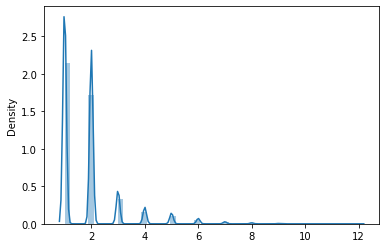

In [18]:
import seaborn as sns
sns.distplot([len(i.split()) for i in X['categories_1'] ])

In [34]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [186]:
num_words = 100000
oov_token = '<UNK>'
pad_type = 'pre'
trunc_type = 'pre'
tokenizer = Tokenizer(num_words=num_words, oov_token=oov_token)
tokenizer.fit_on_texts(X_train['categories_1'] + X_train['categories_2'])

# Get our training data word index
word_index = tokenizer.word_index

# # Encode training data sentences into sequences
# train_sequences_1 = tokenizer.texts_to_sequences(X_train['categories_1'])
# train_sequences_2 = tokenizer.texts_to_sequences(X_train['categories_2'])

# # Pad the training sequences
# train_padded_1 = pad_sequences(train_sequences_1, padding=pad_type, truncating=trunc_type, maxlen=12)
# train_padded_2 = pad_sequences(train_sequences_1, padding=pad_type, truncating=trunc_type, maxlen=12)


# print("Word index:\n", word_index)
# print("\nTraining sequences:\n", train_sequences_1)
# print("\nPadded training sequences:\n", train_padded_1)
# print("\nPadded training shape:", train_padded_1.shape)
# print("Training sequences data type:", type(train_sequences_1))
# print("Padded Training sequences data type:", type(train_padded_1))

In [ ]:
# Save tokenizer as a pickle

import pickle

dict1 = {'foo': tokenizer}

# Store data (serialize)
with open('tokenizer.pickle', 'wb') as handle:
    pickle.dump(dict1, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Load data (deserialize)
with open('tokenizer.pickle', 'rb') as handle:
    fq = pickle.load(handle)

fq['foo'].word_index

In [43]:
def pre_process(X):
    category,lat, lon = X[:,0],X[:,1],X[:,2]
    seq =  tokenizer.texts_to_sequences(category)
    seq = pad_sequences(seq, padding=pad_type, truncating=trunc_type, maxlen=12)
    seq = np.concatenate([seq,np.reshape(lat,(-1,1))], axis = 1)
    seq = np.concatenate([seq,np.reshape(lon,(-1,1))], axis = 1)
    return seq
#pre_processed = pre_process(nm_df[nm_df['match']==1][['categories_1','latitude_1','longitude_1']].values)

In [41]:
def preprocess_doubelets(anchor, validation):
    """
    Given the filenames corresponding to the three images, load and
    preprocess them.
    """

    return (
        pre_process(anchor).astype('float32'),
        pre_process(validation).astype('float32')
      
    )

In [12]:
value_1 = nm_df[['categories_1','latitude_1','longitude_1']].values
value_2 = nm_df[['categories_2','latitude_2','longitude_2']].values

In [13]:
from itertools import starmap
pre = list(starmap(preprocess_doubelets,[(value_1,value_2)]))

In [ ]:
# pos  = tf.data.Dataset.from_tensor_slices(pre[0][0])
# neg  = tf.data.Dataset.from_tensor_slices(pre[0][1])
# y_true = tf.data.Dataset.from_tensor_slices(nm_df['match'].values)

In [ ]:
# dataset = tf.data.Dataset.zip((pos, neg,)
# dataset = dataset.shuffle(buffer_size=1024)
# dataset = dataset.map(preprocess_doubelets)

# # Let's now split our dataset in train and validation.
# train_dataset = dataset.take(round(image_count * 0.8))
# val_dataset = dataset.skip(round(image_count * 0.8))

# train_dataset = train_dataset.batch(32, drop_remainder=False)
# train_dataset = train_dataset.prefetch(8)

# val_dataset = val_dataset.batch(32, drop_remainder=False)
# val_dataset = val_dataset.prefetch(8)

In [24]:
import tensorflow as tf 
from tensorflow.keras.layers import Dense,BatchNormalization,Dropout,Embedding,Input,Concatenate,Reshape, Multiply, Subtract, Add, Multiply, Dropout, Subtract, Add,Lambda
from tensorflow.keras import Model
from keras.regularizers import l2
from keras.models import Sequential
from keras.optimizers import Adam



In [25]:
from keras import backend as K

def cosine_distance(vests):
    x, y = vests
    x = K.l2_normalize(x, axis=-1)
    y = K.l2_normalize(y, axis=-1)
    return -K.mean(x * y, axis=-1, keepdims=True)

def cos_dist_output_shape(shapes):
    shape1, shape2 = shapes
    return (shape1[0],1)


In [26]:
from sklearn.metrics import roc_auc_score

def auroc(y_true, y_pred):
    return tf.numpy_function(roc_auc_score, (y_true, y_pred), tf.double,stateful=False)

In [36]:
input_1 = Input(shape = (14,))
# input_12 = Input(shape = (2,))
# input_2 = Input(shape = (12,))
# input_22 = Input(shape = (2,))

x = Embedding( len(word_index) ,100, input_length = 14)(input_1)
x = Reshape((1400,))(x)
x = Dense(128,activation = 'relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(256,activation = 'relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(512,activation = 'relu')(x)


embeddings = Model(inputs = [input_1], outputs = x)
embeddings.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 14)]              0         
                                                                 
 embedding (Embedding)       (None, 14, 100)           4540100   
                                                                 
 reshape (Reshape)           (None, 1400)              0         
                                                                 
 dense (Dense)               (None, 128)               179328    
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                             

In [37]:
input_2 = Input(shape = (14,))
input_3 = Input(shape = (14,))

embeddings_1 = embeddings(input_2)
embeddings_2 = embeddings(input_3)



x3 = Subtract()([embeddings_1, embeddings_2])
x3 = Multiply()([x3, x3])

x1_ = Multiply()([embeddings_1, embeddings_1])
x2_ = Multiply()([embeddings_2, embeddings_2])
x4 = Subtract()([x1_, x2_])
    
    #https://stackoverflow.com/a/51003359/10650182
x5 = Lambda(cosine_distance, output_shape=cos_dist_output_shape)([embeddings_1, embeddings_2])
    
conc = Concatenate(axis=-1)([x5,x4, x3])

x = Dense(100, activation="relu", name='conc_layer')(conc)
x = Dropout(0.01)(x)
out = Dense(1, activation="sigmoid", name = 'out')(x)

model = Model([input_2, input_3], out)
model.summary()
model.compile(loss="binary_crossentropy", metrics=['acc',auroc], optimizer=Adam(0.00001))

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 14)]         0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 14)]         0           []                               
                                                                                                  
 model (Functional)             (None, 512)          4885572     ['input_3[0][0]',                
                                                                  'input_4[0][0]']                
                                                                                                  
 multiply_1 (Multiply)          (None, 512)          0           ['model[0][0]',            

In [97]:
tensorboard  =tf.keras.callbacks.TensorBoard(
    log_dir='logs'
)
early_stop  =tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=.001,
    patience=5,
    verbose=1,
    mode="auto",
    restore_best_weights=True,
)



In [98]:
 
model.fit([pre[0][0][X_train],pre[0][1][X_train]],nm_df['match'][y_train], epochs = 100,
       validation_data=([pre[0][0][X_test],pre[0][1][X_test]],nm_df['match'][y_test]),batch_size = 128,steps_per_epoch=len(X_test)//128,
    validation_steps=len(X_test)//128,
    validation_batch_size=128, callbacks = [tensorboard, early_stop])

Epoch 1/100
4589/4589 [==============================] - 67s 14ms/step - loss: 0.3911 - acc: 0.8277 - auroc: 0.8751 - val_loss: 0.3159 - val_acc: 0.9054 - val_auroc: 0.9434
Epoch 2/100
4589/4589 [==============================] - 67s 15ms/step - loss: 0.2419 - acc: 0.9040 - auroc: 0.9598 - val_loss: 0.2834 - val_acc: 0.9171 - val_auroc: 0.9589
Epoch 3/100
4589/4589 [==============================] - 67s 15ms/step - loss: 0.2073 - acc: 0.9173 - auroc: 0.9701 - val_loss: 0.2630 - val_acc: 0.9224 - val_auroc: 0.9631
Epoch 4/100
4589/4589 [==============================] - 68s 15ms/step - loss: 0.1899 - acc: 0.9234 - auroc: 0.9748 - val_loss: 0.2485 - val_acc: 0.9264 - val_auroc: 0.9647
Epoch 5/100
4589/4589 [==============================] - 66s 14ms/step - loss: 0.1794 - acc: 0.9273 - auroc: 0.9774 - val_loss: 0.2408 - val_acc: 0.9282 - val_auroc: 0.9667
Epoch 6/100
4589/4589 [==============================] - 71s 15ms/step - loss: 0.1704 - acc: 0.9311 - auroc: 0.9797 - val_loss: 0.2331 

In [99]:
model.save('cosine.h5')

In [38]:
model.load_weights('cosine.h5')

In [21]:
embedding_model = Model(model.get_layer('model').inputs,model.get_layer('model').outputs)
embedding_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 14)]              0         
                                                                 
 embedding (Embedding)       (None, 14, 100)           4540100   
                                                                 
 reshape (Reshape)           (None, 1400)              0         
                                                                 
 dense (Dense)               (None, 128)               179328    
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                           

In [57]:
extracted_embeddings = []

prev = 0
for f,i in tqdm(enumerate(range(2000,1780121,2000))):
    j = range(prev,i)
    extracted_embeddings.append(embedding_model.predict(pre[0][0][j],verbose=0))
    prev = i
    

890it [01:39,  8.91it/s]


In [58]:
extracted_embeddings  = np.vstack(extracted_embeddings)
extracted_embeddings.shape

(1780000, 512)

In [69]:
a = nm_df[nm_df['match'] == 0].index[:10000]
b = nm_df[nm_df['match'] == 1].index[:10000]

In [70]:
from sklearn.manifold import TSNE
X = np.vstack([extracted_embeddings[a] ,extracted_embeddings[b]])
X_embedded = TSNE(n_components=2, learning_rate='auto',
                   init='random').fit_transform(X)
X_embedded.shape

(20000, 2)

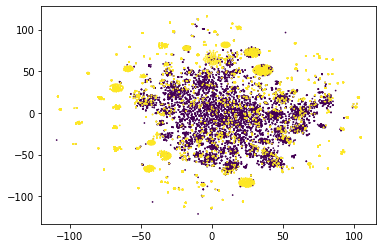

In [71]:
# To plot the embedding
import matplotlib.pyplot as plt
%matplotlib inline
plt.scatter(X_embedded[:,0], X_embedded[:,1], c = np.vstack([nm_df['match'].values[a] ,nm_df['match'].values[b]]), s = 0.5)

In [29]:
serving.shape

(5, 12)

# Predict only on nearest neighbours

In [14]:
def generate_test_data(df, rounds = 3, n_neighbors = 5, features = ['id', 'latitude', 'longitude','categories']):
    # Scale data for KNN
#     scaler = StandardScaler()
    scaled_data = df[features[1:3]]
    print(df.shape)
    # Fit KNN and predict indices
    knn_model = NearestNeighbors(
        n_neighbors = n_neighbors, 
        radius = 1.0, 
        algorithm = 'kd_tree', 
        leaf_size = 30, 
        metric = 'minkowski', 
        p = 2, 
        n_jobs = -1
    )
    knn_model.fit(scaled_data)
    indices = knn_model.kneighbors(scaled_data, return_distance = False)
    # Create a new dataframe to slice faster
    df_features = df[features]
    # Create a dataset to store final results
    dataset = []
    # Iterate through each round and get generated data
    for j in range(rounds):
        # Create temporal dataset to store round data
        tmp_dataset = []
        # Iterate through each row
        for k in tqdm(range(len(df))):
            neighbors = list(indices[k])
            # Remove self from neighbors if exist
            try:
                neighbors.remove(k)
            except:
                pass
            # Use iterator as first indices
            ind1 = k
            # Select from the neighbor list the second indices
            ind2 = neighbors[j]
            # Check if indices are the same, they should not be the same
            if ind1 == ind2:
                print('Indices are the same, error')
            # Slice features dataframe
            tmp1 = df_features.loc[ind1]
            tmp2 = df_features.loc[ind2]
            # Concatenate, don't add target, this is the test set
            tmp = np.concatenate([tmp1, tmp2], axis = 0)
            tmp_dataset.append(tmp)  
        # Transform tmp_dataset to a pd.DataFrame
        tmp_dataset = pd.DataFrame(tmp_dataset, columns = [i + '_1' for i in features] + [i + '_2' for i in features])
        # Append round
        dataset.append(tmp_dataset)
    # Concatenate rounds to get final dataset
    dataset = pd.concat(dataset, axis = 0)
    # Remove duplicates
    dataset.drop_duplicates(inplace = True)
    # Reset index
    dataset.reset_index(drop = True, inplace = True)
    col_64 = list(dataset.dtypes[dataset.dtypes == np.float64].index)
    for col in col_64:
        dataset[col] = dataset[col].astype(np.float32)
    return df, dataset

In [15]:
df, dataset = generate_test_data(serving)

(5, 12)


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2502.87it/s]


In [129]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.neighbors import NearestNeighbors
from tqdm.notebook import tqdm
import re
from itertools import starmap
serving = pd.read_csv('test.csv')
serving.head()


def build_model():
    input_1 = Input(shape = (14,))
# input_12 = Input(shape = (2,))
# input_2 = Input(shape = (12,))
# input_22 = Input(shape = (2,))

    x = Embedding( len(word_index) ,100, input_length = 14)(input_1)
    x = Reshape((1400,))(x)
    x = Dense(128,activation = 'relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)
    x = Dense(256,activation = 'relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)
    x = Dense(512,activation = 'relu')(x)


    embeddings = Model(inputs = [input_1], outputs = x)
    input_2 = Input(shape = (14,))
    input_3 = Input(shape = (14,))

    embeddings_1 = embeddings(input_2)
    embeddings_2 = embeddings(input_3)



    x3 = Subtract()([embeddings_1, embeddings_2])
    x3 = Multiply()([x3, x3])

    x1_ = Multiply()([embeddings_1, embeddings_1])
    x2_ = Multiply()([embeddings_2, embeddings_2])
    x4 = Subtract()([x1_, x2_])

        #https://stackoverflow.com/a/51003359/10650182
    x5 = Lambda(cosine_distance, output_shape=cos_dist_output_shape)([embeddings_1, embeddings_2])

    conc = Concatenate(axis=-1)([x5,x4, x3])

    x = Dense(100, activation="relu", name='conc_layer')(conc)
    x = Dropout(0.01)(x)
    out = Dense(1, activation="sigmoid", name = 'out')(x)

    model = Model([input_2, input_3], out)


    return model
model = build_model()
model.load_weights('cosine.h5')
def pre_process(X):
    lat, lon, category = X[:,0],X[:,1],X[:,2]
    seq =  tokenizer.texts_to_sequences(category)
    seq = pad_sequences(seq, padding=pad_type, truncating=trunc_type, maxlen=12)
    seq = np.concatenate([seq,np.reshape(lat,(-1,1))], axis = 1)
    seq = np.concatenate([seq,np.reshape(lon,(-1,1))], axis = 1)
    return seq
#pre_processed = pre_process(nm_df[nm_df['match']==1][['categories_1','latitude_1','longitude_1']].values)

def predict(df):
    match_list = []
    for values in tqdm(df.iterrows()):
        anchor, validate = preprocess_doubelets(np.array(values[1][1:4]).reshape(1,-1),np.array(values[1][5:]).reshape(1,-1))
        pred = model.predict([ anchor, validate])
        if pred > 0.3:
            match = 1
            
        else :
            match = 0
        match_list.append(match)
    df['match'] = match_list
    return df

In [130]:
df = predict(dataset)

0it [00:00, ?it/s]

1/1 [==============================] - 0s 11ms/step


In [131]:
temp = dict(list(df.groupby('id_1')))
temp2 = pd.DataFrame()
for k in temp.keys():
    print(k)
    eval_df = temp[k]
    eval_df['match_id'] = eval_df[eval_df['match']==1]['id_2']
    eval_df.fillna('NA',inplace = True)
    temp2 = pd.concat([eval_df,temp2],axis = 0)
temp2.head(15)

E_00001118ad0191
E_000020eb6fed40
E_00002f98667edf
E_001b6bad66eb98
E_0283d9f61e569d


,id_1,latitude_1,longitude_1,categories_1,id_2,latitude_2,longitude_2,categories_2,match,match_id
4,E_0283d9f61e569d,-3.021727,104.788628,Soccer Stadiums,E_001b6bad66eb98,-3.014675,104.794373,Stadiums,1,E_001b6bad66eb98
9,E_0283d9f61e569d,-3.021727,104.788628,Soccer Stadiums,E_00001118ad0191,5.012169,100.535805,Cafés,0,NA
14,E_0283d9f61e569d,-3.021727,104.788628,Soccer Stadiums,E_00002f98667edf,47.215134,39.686089,ATMs,0,NA
3,E_001b6bad66eb98,-3.014675,104.794373,Stadiums,E_0283d9f61e569d,-3.021727,104.788628,Soccer Stadiums,1,E_0283d9f61e569d
8,E_001b6bad66eb98,-3.014675,104.794373,Stadiums,E_00001118ad0191,5.012169,100.535805,Cafés,0,NA
13,E_001b6bad66eb98,-3.014675,104.794373,Stadiums,E_00002f98667edf,47.215134,39.686089,ATMs,0,NA
2,E_00002f98667edf,47.215134,39.686089,ATMs,E_00001118ad0191,5.012169,100.535805,Cafés,0,NA
7,E_00002f98667edf,47.215134,39.686089,ATMs,E_0283d9f61e569d,-3.021727,104.788628,Soccer Stadiums,0,NA
12,E_00002f98667edf,47.215134,39.686089,ATMs,E_001b6bad66eb98,-3.014675,104.794373,Stadiums,0,NA
1,E_000020eb6fed40,40.434208,-80.564163,Bars,E_00002f98667edf,47.215134,39.686089,ATMs,0,NA


In [141]:
eval_df = temp2.groupby('id_1')['match_id'].\
                        apply(list).reset_index()
eval_df



,id_1,match_id
0,E_00001118ad0191,"[NA, NA, NA]"
1,E_000020eb6fed40,"[NA, NA, NA]"
2,E_00002f98667edf,"[NA, NA, NA]"
3,E_001b6bad66eb98,"[E_0283d9f61e569d, NA, NA]"
4,E_0283d9f61e569d,"[E_001b6bad66eb98, NA, NA]"


# Prediction on test data set 

In [178]:
def matches(id1,list1):
    str1 = ' '.join(set(list1))
    str1 = str1.replace('NA','')
    
    str1 = re.sub(r' ','',str1)
    if str1 == '':
        str1 = id1
    else:
        str1 = id1+' '+str1
    return str1
matches(eval_df['id_1'].iloc[4],eval_df['match_id'].iloc[4])


l1 = list(starmap(matches,[(i,j) for i,j in zip(eval_df['id_1'].values,eval_df['match_id'].values)]))
eval_df['match'] = l1
eval_df = eval_df.drop(labels='match_id', axis=1)
eval_df

,id_1,match
0,E_00001118ad0191,E_00001118ad0191
1,E_000020eb6fed40,E_000020eb6fed40
2,E_00002f98667edf,E_00002f98667edf
3,E_001b6bad66eb98,E_001b6bad66eb98 E_0283d9f61e569d
4,E_0283d9f61e569d,E_0283d9f61e569d E_001b6bad66eb98
